### Solayman Hossain Emon
### ID: 80744292

In [1]:
using CSV, DataFrames, GLM, RegressionTables, Gadfly, Plots

In [2]:
# Enable printing of 1000 columns
ENV["COLUMNS"] = 1000

1000

# Reading the Data

In [3]:
fb_data = CSV.read("dataset_Facebook.csv", DataFrame)

,Page total likes,Type,Category,Post Month,Post Weekday,Post Hour,Paid,Lifetime Post Total Reach,Lifetime Post Total Impressions,Lifetime Engaged Users,Lifetime Post Consumers,Lifetime Post Consumptions,Lifetime Post Impressions by people who have liked your Page,Lifetime Post reach by people who like your Page,Lifetime People who have liked your Page and engaged with your post,comment,like,share,Total Interactions
,Int64,String7,Int64,Int64,Int64,Int64,Int64?,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64?,Int64?,Int64
1,139441,Photo,2,12,4,3,0,2752,5091,178,109,159,3078,1640,119,4,79,17,100
2,139441,Status,2,12,3,10,0,10460,19057,1457,1361,1674,11710,6112,1108,5,130,29,164
3,139441,Photo,3,12,3,3,0,2413,4373,177,113,154,2812,1503,132,0,66,14,80
4,139441,Photo,2,12,2,10,1,50128,87991,2211,790,1119,61027,32048,1386,58,1572,147,1777
5,139441,Photo,2,12,2,3,0,7244,13594,671,410,580,6228,3200,396,19,325,49,393
6,139441,Status,2,12,1,9,0,10472,20849,1191,1073,1389,16034,7852,1016,1,152,33,186
7,139441,Photo,3,12,1,3,1,11692,19479,481,265,364,15432,9328,379,3,249,27,279
8,139441,Photo,3,12,7,9,1,13720,24137,537,232,305,19728,11056,422,0,325,14,339
9,139441,Status,2,12,7,3,0,11844,22538,1530,1407,1692,15220,7912,1250,0,161,31,192


In [4]:
println(size(fb_data))

(500, 19)


In [5]:
names(fb_data)

19-element Vector{String}:
 "Page total likes"
 "Type"
 "Category"
 "Post Month"
 "Post Weekday"
 "Post Hour"
 "Paid"
 "Lifetime Post Total Reach"
 "Lifetime Post Total Impressions"
 "Lifetime Engaged Users"
 "Lifetime Post Consumers"
 "Lifetime Post Consumptions"
 "Lifetime Post Impressions by people who have liked your Page"
 "Lifetime Post reach by people who like your Page"
 "Lifetime People who have liked your Page and engaged with your post"
 "comment"
 "like"
 "share"
 "Total Interactions"

In [6]:
describe(fb_data)

,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Int64,Type
1,Page total likes,1.23194e5,81370,129600.0,139441,0,Int64
2,Type,,Link,,Video,0,String7
3,Category,1.88,1,2.0,3,0,Int64
4,Post Month,7.038,1,7.0,12,0,Int64
5,Post Weekday,4.15,1,4.0,7,0,Int64
6,Post Hour,7.84,1,9.0,23,0,Int64
7,Paid,0.278557,0,0.0,1,1,"Union{Missing, Int64}"
8,Lifetime Post Total Reach,13903.4,238,5281.0,180480,0,Int64
9,Lifetime Post Total Impressions,29585.9,570,9051.0,1110282,0,Int64


## Handling the Columns with Space

In [7]:
rename!(fb_data, Dict(:"Page total likes" => :"Page_total_likes", 
                      :"Post Month" => :"Post_Month", 
                      :"Post Hour" => :"Post_Hour", 
                      :"Post Weekday" => :"Post_Weekday"));

In [8]:
names(fb_data)

19-element Vector{String}:
 "Page_total_likes"
 "Type"
 "Category"
 "Post_Month"
 "Post_Weekday"
 "Post_Hour"
 "Paid"
 "Lifetime Post Total Reach"
 "Lifetime Post Total Impressions"
 "Lifetime Engaged Users"
 "Lifetime Post Consumers"
 "Lifetime Post Consumptions"
 "Lifetime Post Impressions by people who have liked your Page"
 "Lifetime Post reach by people who like your Page"
 "Lifetime People who have liked your Page and engaged with your post"
 "comment"
 "like"
 "share"
 "Total Interactions"

In [9]:
dropmissing!(fb_data, :"like");
dropmissing!(fb_data, :"Paid");
dropmissing!(fb_data, :"share");
describe(fb_data)

,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Int64,DataType
1,Page_total_likes,1.23173e5,81370,129600.0,139441,0,Int64
2,Type,,Link,,Video,0,String7
3,Category,1.88687,1,2.0,3,0,Int64
4,Post_Month,7.02828,1,7.0,12,0,Int64
5,Post_Weekday,4.13333,1,4.0,7,0,Int64
6,Post_Hour,7.84444,1,9.0,23,0,Int64
7,Paid,0.280808,0,0.0,1,0,Int64
8,Lifetime Post Total Reach,14028.1,238,5290.0,180480,0,Int64
9,Lifetime Post Total Impressions,29857.0,570,9084.0,1110282,0,Int64


# 1. Multiple Regression Model

## (a) Fit the Model

In [10]:
m1 = @formula(like~Category+Page_total_likes+Type+Post_Month+Post_Hour+Post_Weekday+Paid+comment)

FormulaTerm
Response:
  like(unknown)
Predictors:
  Category(unknown)
  Page_total_likes(unknown)
  Type(unknown)
  Post_Month(unknown)
  Post_Hour(unknown)
  Post_Weekday(unknown)
  Paid(unknown)
  comment(unknown)

In [11]:
model1 = lm(m1, fb_data)

StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, LinearAlgebra.CholeskyPivoted{Float64, Matrix{Float64}}}}, Matrix{Float64}}

like ~ 1 + Category + Page_total_likes + Type + Post_Month + Post_Hour + Post_Weekday + Paid + comment

Coefficients:
───────────────────────────────────────────────────────────────────────────────────────────
                          Coef.    Std. Error      t  Pr(>|t|)      Lower 95%     Upper 95%
───────────────────────────────────────────────────────────────────────────────────────────
(Intercept)       -76.0596       134.32        -0.57    0.5715  -339.982       187.863
Category           40.9061         9.67147      4.23    <1e-04    21.9028       59.9093
Page_total_likes    0.000477266    0.00146798   0.33    0.7452    -0.00240714    0.00336168
Type: Photo        15.2491        39.8225       0.38    0.7019   -62.9973       93.4955
Type: Status      -19.0594        47.4556      -0.40    0.6881  -112.304 

## R-Squared Values

In [12]:
# R Square value of the model
r2(model1)

0.717372980012585

## Coefficient Significance

In [13]:
coef(model1)

11-element Vector{Float64}:
 -76.05956033276802
  40.90605304627139
   0.00047726636210155047
  15.249068574473092
 -19.05938067480692
  19.52481991626934
   1.7007699271319174
  -0.4066248513377943
  -1.5825611175721401
  35.10660018204332
  12.654937461963543

## Refit with Logarithm Transformation

In [14]:
m1_log = @formula(log1p(like)~Category+log1p(Page_total_likes)+Type+Post_Month+Post_Hour+Post_Weekday+Paid)
model1_log = lm(mm, fb_data)

LoadError: MethodError: no method matching fit(::Type{LinearModel}, ::Measures.AbsoluteLength, ::DataFrame, ::Nothing)
[0mClosest candidates are:
[0m  fit([91m::StatisticalModel[39m, ::Any...) at C:\Users\ASUS\.julia\packages\StatsBase\IPydo\src\statmodels.jl:178
[0m  fit(::Type{T}, [91m::FormulaTerm[39m, ::Any, ::Any...; contrasts, kwargs...) where T<:RegressionModel at C:\Users\ASUS\.julia\packages\StatsModels\m1jYD\src\statsmodel.jl:78
[0m  fit(::Type{T}, [91m::FormulaTerm[39m, ::Any, ::Any...; contrasts, kwargs...) where T<:StatisticalModel at C:\Users\ASUS\.julia\packages\StatsModels\m1jYD\src\statsmodel.jl:78
[0m  ...

In [15]:
# R Square value of the model
r2(model1_log)

LoadError: UndefVarError: model1_log not defined

In [247]:
coef(model1_log)

10-element Vector{Float64}:
 -9.698556404446071
  0.40557034980235973
  1.1595758609956286
  0.44432673727588945
  0.7092246134950749
  1.3856007166483466
 -0.03772427706108226
 -0.015573736135879092
 -0.055960342598400256
  0.2859968739277099

##  Models Dignostics

In [248]:
regtable(model1, model1_log)


-------------------------------------------------
                             like     log1p(like)
                          ---------   -----------
                                (1)           (2)
-------------------------------------------------
(Intercept)                 -76.060        -9.699
                          (134.320)      (10.526)
Category                  40.906***      0.406***
                            (9.671)       (0.061)
Page_total_likes              0.000              
                            (0.001)              
Type: Photo                  15.249         0.444
                           (39.823)       (0.251)
Type: Status                -19.059        0.709*
                           (47.456)       (0.299)
Type: Video                  19.525       1.386**
                           (76.852)       (0.485)
Post_Month                    1.701        -0.038
                            (7.259)       (0.040)
Post_Hour                    -0.407        -0.016

## (C) Assumptions

In [249]:
# predicted values
pred1 = predict(model1_log)
# residuals
red1 = fb_data[!, :like] - pred1;

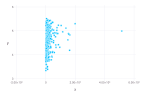

In [250]:
# homoscedasticity Assumption 
plot(x=red1,y=pred1, Geom.point)

### Here the variance is not same in different X value, so homoscedasticity assumption is not OK

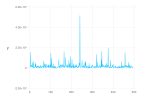

In [251]:
# Independence Assumption
plot(y=red1, Geom.line)

### All the observations look random, So the independent assumption hold

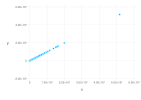

In [252]:
# Exogeneity assumption
plot(x = fb_data[!, :like], y=red1)

### We observed some pattern over the plot, so the Epsilon captured some information with was left out previously. It violating the assumption & might missed some idependent varaiable

### Adding Some more varaiable for Observing the Diagnostic Changes in the Model

In [253]:
rename!(fb_data, Dict(:"Total Interactions" => :"Total_Interactions"));

In [254]:
m1_test = @formula(log1p(like)~Category+log1p(Page_total_likes)+Type+Post_Month+Post_Hour+Post_Weekday+Paid+Total_Interactions)
model1_test = lm(m1_test, fb_data)

StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, CholeskyPivoted{Float64, Matrix{Float64}}}}, Matrix{Float64}}

:(log1p(like)) ~ 1 + Category + :(log1p(Page_total_likes)) + Type + Post_Month + Post_Hour + Post_Weekday + Paid + Total_Interactions

Coefficients:
─────────────────────────────────────────────────────────────────────────────────────────────
                               Coef.   Std. Error      t  Pr(>|t|)     Lower 95%    Upper 95%
─────────────────────────────────────────────────────────────────────────────────────────────
(Intercept)              -3.25106     8.61178      -0.38    0.7060  -20.1722      13.67
Category                  0.315722    0.0502231     6.29    <1e-09    0.217039     0.414404
log1p(Page_total_likes)   0.587934    0.75657       0.78    0.4375   -0.898632     2.0745
Type: Photo               0.329696    0.205415      1.61    0.1091   -0.0739186    0.733311
Type: Status              0.601503    0.244

In [255]:
# predicted values
pred1_test = predict(model1_test)
# residuals
red1_test = fb_data[!, :like] - pred1_test;

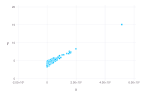

In [256]:
# homoscedasticity Assumption 
plot(x=red1_test, y=pred1_test, Geom.point)

### We can observed that after adding more variables (not all) the homoscedasticity assumption behavior is varying from the previous

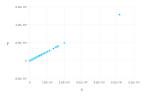

In [257]:
# Exogeneity assumption
plot(x = fb_data[!, :like], y=red1_test)

### The Exogeneity assumption is not changed from the previous

In [258]:
regtable(model1, model1_log, model1_test)


---------------------------------------------------------
                             like         log1p(like)    
                          ---------   -------------------
                                (1)        (2)        (3)
---------------------------------------------------------
(Intercept)                 -76.060     -9.699     -3.251
                          (134.320)   (10.526)    (8.612)
Category                  40.906***   0.406***   0.316***
                            (9.671)    (0.061)    (0.050)
Page_total_likes              0.000                      
                            (0.001)                      
Type: Photo                  15.249      0.444      0.330
                           (39.823)    (0.251)    (0.205)
Type: Status                -19.059     0.709*     0.602*
                           (47.456)    (0.299)    (0.245)
Type: Video                  19.525    1.386**    1.128**
                           (76.852)    (0.485)    (0.397)
Post_Month   

## After doing Logarithm transformation and adding some Extra variable from the dataset the performanace of the Multiple Linear Regression is increasing and some assumptions are really closed to be hold. So, we can assume that doing some appropriate transformation and evaluating assumption after adding variables will be the possible remedy to handle this.

##  (b) Dropping Some Variables and Observe the Result

In [259]:
m1_drop = @formula(log1p(like)~Category+Type+Paid+Total_Interactions)
model1_drop = lm(m1_drop, fb_data)

StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, CholeskyPivoted{Float64, Matrix{Float64}}}}, Matrix{Float64}}

:(log1p(like)) ~ 1 + Category + Type + Paid + Total_Interactions

Coefficients:
─────────────────────────────────────────────────────────────────────────────────────
                         Coef.   Std. Error      t  Pr(>|t|)    Lower 95%   Upper 95%
─────────────────────────────────────────────────────────────────────────────────────
(Intercept)         3.20202     0.201682     15.88    <1e-45   2.80574     3.59829
Category            0.329537    0.0492241     6.69    <1e-10   0.23282     0.426254
Type: Photo         0.318409    0.201101      1.58    0.1140  -0.0767211   0.713539
Type: Status        0.587141    0.238663      2.46    0.0142   0.118207    1.05607
Type: Video         1.13495     0.392664      2.89    0.0040   0.363431    1.90647
Paid                0.151624    0.0910276     1.67    0.0964  -0.0272303   0.3304

In [260]:
regtable(model1, model1_log, model1_test, model1_drop)


--------------------------------------------------------------------
                             like               log1p(like)         
                          ---------   ------------------------------
                                (1)        (2)        (3)        (4)
--------------------------------------------------------------------
(Intercept)                 -76.060     -9.699     -3.251   3.202***
                          (134.320)   (10.526)    (8.612)    (0.202)
Category                  40.906***   0.406***   0.316***   0.330***
                            (9.671)    (0.061)    (0.050)    (0.049)
Page_total_likes              0.000                                 
                            (0.001)                                 
Type: Photo                  15.249      0.444      0.330      0.318
                           (39.823)    (0.251)    (0.205)    (0.201)
Type: Status                -19.059     0.709*     0.602*     0.587*
                           (47.45

In [261]:
# predicted values
pred1_drop = predict(model1_drop)
# residuals
red1_drop = fb_data[!, :like] - pred1_drop;

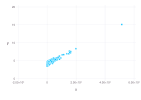

In [262]:
# homoscedasticity Assumption 
plot(x=red1_drop, y=pred1_drop, Geom.point)

### After droppoing some variables from the model, we don't find any significant improvement on the basis of  **R2** value and Assumptions. So, directly dropping variables might not be a convenient remedy for the regression problem. Otherwise, fixing is more effective way to handle this

## (d) Non-Linear Association

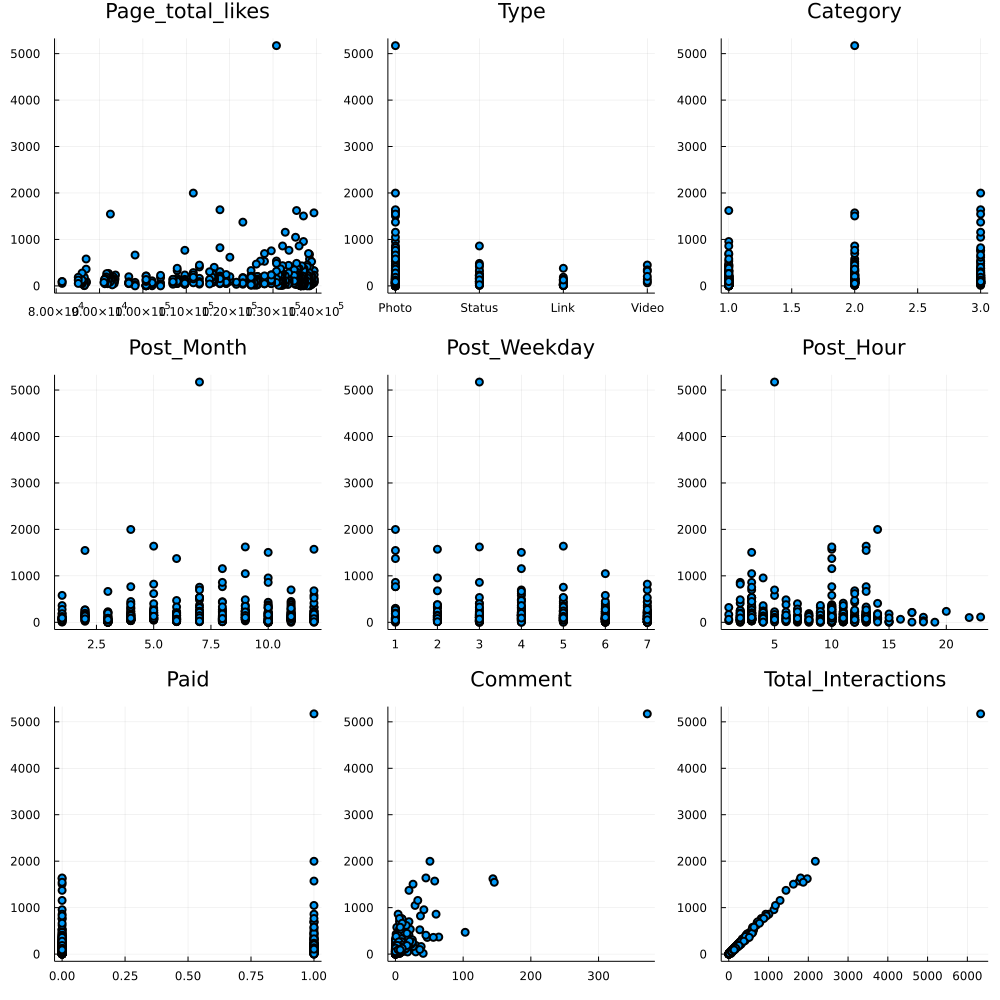

In [263]:
p1 = scatter(fb_data[!,:Page_total_likes], fb_data[!,:like], title = "Page_total_likes");
p2 = scatter(fb_data[!,:Type], fb_data[!,:like], title = "Type");
p3 = scatter(fb_data[!,:Category], fb_data[!,:like], title = "Category");
p4 = scatter(fb_data[!,:Post_Month], fb_data[!,:like], title = "Post_Month");
p5 = scatter(fb_data[!,:Post_Weekday], fb_data[!,:like], title = "Post_Weekday");
p6 = scatter(fb_data[!,:Post_Hour], fb_data[!,:like], title = "Post_Hour");
p7 = scatter(fb_data[!,:Paid], fb_data[!,:like], title = "Paid");
p8 = scatter(fb_data[!,:comment], fb_data[!,:like], title = "Comment");
p9 = scatter(fb_data[!,:Total_Interactions], fb_data[!,:like], title = "Total_Interactions");


Plots.plot(p1, p2, p3, p4, p5, p6, p7, p8, p9, layout = (3, 3), legend = false)
plot!(size=(1000, 1000))

In [264]:
names(fb_data)

19-element Vector{String}:
 "Page_total_likes"
 "Type"
 "Category"
 "Post_Month"
 "Post_Weekday"
 "Post_Hour"
 "Paid"
 "Lifetime Post Total Reach"
 "Lifetime Post Total Impressions"
 "Lifetime Engaged Users"
 "Lifetime Post Consumers"
 "Lifetime Post Consumptions"
 "Lifetime Post Impressions by people who have liked your Page"
 "Lifetime Post reach by people who like your Page"
 "Lifetime People who have liked your Page and engaged with your post"
 "comment"
 "like"
 "share"
 "Total_Interactions"

# 2. Repeat Procedure with Another Outcome Variables

In [265]:
m2 = @formula(comment~Category+Page_total_likes+Type+Post_Month+Post_Hour+Post_Weekday+Paid)

FormulaTerm
Response:
  comment(unknown)
Predictors:
  Category(unknown)
  Page_total_likes(unknown)
  Type(unknown)
  Post_Month(unknown)
  Post_Hour(unknown)
  Post_Weekday(unknown)
  Paid(unknown)

In [266]:
model2 = lm(m2, fb_data)

StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, CholeskyPivoted{Float64, Matrix{Float64}}}}, Matrix{Float64}}

comment ~ 1 + Category + Page_total_likes + Type + Post_Month + Post_Hour + Post_Weekday + Paid

Coefficients:
───────────────────────────────────────────────────────────────────────────────────────────
                          Coef.    Std. Error      t  Pr(>|t|)      Lower 95%     Upper 95%
───────────────────────────────────────────────────────────────────────────────────────────
(Intercept)       -15.4458       16.3873       -0.94    0.3464  -47.6447       16.7532
Category            0.38268       1.18089       0.32    0.7460   -1.93761       2.70297
Page_total_likes    0.000230311   0.000178956   1.29    0.1987   -0.000121314   0.000581935
Type: Photo         3.06945       4.86088       0.63    0.5280   -6.48154      12.6204
Type: Status        4.92695       5.79066       0.85    0.3953   -6.45093      16.3048
Type: Vi

In [267]:
# predicted values
pred2 = predict(model2)
# residuals
red2 = fb_data[!, :like] - pred2;

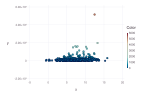

In [268]:
# Homoscedasticity assumption
plot(x=pred2, y=red2,color=fb_data[!, :like])

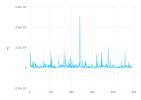

In [269]:
# independence
plot(y=red2, Geom.line)

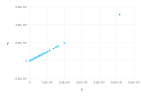

In [270]:
# Exogeneity assumption
plot(x = fb_data[!, :like], y=red2)

In [271]:
m3 = @formula(share~Category+Page_total_likes+Type+Post_Month+Post_Hour+Post_Weekday+Paid)

FormulaTerm
Response:
  share(unknown)
Predictors:
  Category(unknown)
  Page_total_likes(unknown)
  Type(unknown)
  Post_Month(unknown)
  Post_Hour(unknown)
  Post_Weekday(unknown)
  Paid(unknown)

In [272]:
model3 = lm(m3, fb_data)

StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, CholeskyPivoted{Float64, Matrix{Float64}}}}, Matrix{Float64}}

share ~ 1 + Category + Page_total_likes + Type + Post_Month + Post_Hour + Post_Weekday + Paid

Coefficients:
─────────────────────────────────────────────────────────────────────────────────────────
                         Coef.    Std. Error      t  Pr(>|t|)      Lower 95%    Upper 95%
─────────────────────────────────────────────────────────────────────────────────────────
(Intercept)       -2.87188      32.4438       -0.09    0.9295  -66.6196       60.8758
Category           6.98957       2.33794       2.99    0.0029    2.39584      11.5833
Page_total_likes   0.000168141   0.000354298   0.47    0.6353   -0.000528007   0.00086429
Type: Photo        8.81314       9.62361       0.92    0.3602  -10.096        27.7223
Type: Status      13.6812       11.4644        1.19    0.2333   -8.84483      36.2072
Type: Video       39.29

In [273]:
# predicted values
pred3 = predict(model3)
# residuals
red3 = fb_data[!, :like] - pred3;

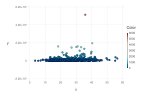

In [274]:
# Homoscedasticity assumption
plot(x=pred3, y=red3,color=fb_data[!, :like])

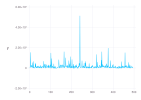

In [275]:
# independence
plot(y=red3, Geom.line)

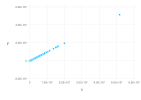

In [276]:
# Exogeneity assumption
plot(x = fb_data[!, :like], y=red3)

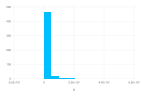

In [277]:
# error distribution
using Gadfly
plot(x=red3, Geom.histogram(bincount=10))

In [278]:
regtable(model2, model3)


--------------------------------------
                    comment     share 
                   --------   --------
                        (1)        (2)
--------------------------------------
(Intercept)         -15.446     -2.872
                   (16.387)   (32.444)
Category              0.383    6.990**
                    (1.181)    (2.338)
Page_total_likes      0.000      0.000
                    (0.000)    (0.000)
Type: Photo           3.069      8.813
                    (4.861)    (9.624)
Type: Status          4.927     13.681
                    (5.791)   (11.464)
Type: Video           6.718    39.294*
                    (9.380)   (18.570)
Post_Month           -1.036     -1.133
                    (0.885)    (1.752)
Post_Hour             0.025     -0.472
                    (0.228)    (0.451)
Post_Weekday         -0.747     -0.790
                    (0.475)    (0.940)
Paid                  3.332      6.659
                    (2.150)    (4.257)
------------------------

In [279]:
m2_log = @formula(log1p(comment)~Category+log1p(Page_total_likes)+Type+Post_Month+Post_Hour+Post_Weekday+Paid)
m3_log = @formula(log1p(share)~Category+log1p(Page_total_likes)+Type+Post_Month+Post_Hour+Post_Weekday+Paid)
model2_log = lm(m2_log, fb_data)

StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, CholeskyPivoted{Float64, Matrix{Float64}}}}, Matrix{Float64}}

:(log1p(comment)) ~ 1 + Category + :(log1p(Page_total_likes)) + Type + Post_Month + Post_Hour + Post_Weekday + Paid

Coefficients:
────────────────────────────────────────────────────────────────────────────────────────────
                                Coef.  Std. Error      t  Pr(>|t|)     Lower 95%   Upper 95%
────────────────────────────────────────────────────────────────────────────────────────────
(Intercept)              -10.2293      10.0858     -1.01    0.3110  -30.0466      9.58791
Category                   0.109983     0.0584973   1.88    0.0607   -0.00495623  0.224923
log1p(Page_total_likes)    0.981862     0.886047    1.11    0.2684   -0.759102    2.72283
Type: Photo                0.288885     0.240698    1.20    0.2306   -0.184054    0.761825
Type: Status               0.651607     0.2868      2.27    0.02

In [280]:
model3_log = lm(m3_log, fb_data)

StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, CholeskyPivoted{Float64, Matrix{Float64}}}}, Matrix{Float64}}

:(log1p(share)) ~ 1 + Category + :(log1p(Page_total_likes)) + Type + Post_Month + Post_Hour + Post_Weekday + Paid

Coefficients:
──────────────────────────────────────────────────────────────────────────────────────────
                               Coef.  Std. Error      t  Pr(>|t|)   Lower 95%    Upper 95%
──────────────────────────────────────────────────────────────────────────────────────────
(Intercept)               7.25892     8.57994      0.85    0.3980  -9.59952    24.1174
Category                  0.431007    0.0497634    8.66    <1e-16   0.333229    0.528786
log1p(Page_total_likes)  -0.448924    0.753756    -0.60    0.5517  -1.92995     1.03211
Type: Photo               0.366645    0.204761     1.79    0.0740  -0.0356827   0.768973
Type: Status              0.64526     0.24398      2.64    0.0084   0.165872    1

In [281]:
regtable(model2_log, model3_log)


-------------------------------------------------------
                          log1p(comment)   log1p(share)
                          --------------   ------------
                                     (1)            (2)
-------------------------------------------------------
(Intercept)                      -10.229          7.259
                                (10.086)        (8.580)
Category                           0.110       0.431***
                                 (0.058)        (0.050)
log1p(Page_total_likes)            0.982         -0.449
                                 (0.886)        (0.754)
Type: Photo                        0.289          0.367
                                 (0.241)        (0.205)
Type: Status                      0.652*        0.645**
                                 (0.287)        (0.244)
Type: Video                       1.186*       1.518***
                                 (0.465)        (0.395)
Post_Month                        -0.036       

In [282]:
# predicted values
pred2_log = predict(model2_log)
# residuals
red2_log = fb_data[!, :like] - pred2_log;

# predicted values
pred3_log = predict(model3_log)
# residuals
red3_log = fb_data[!, :like] - pred3_log;

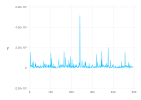

In [283]:
# independence
plot(y=red2_log, Geom.line)

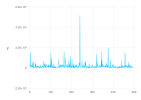

In [284]:
# independence
plot(y=red3_log, Geom.line)

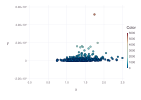

In [285]:
# Homoscedasticity assumption
plot(x=pred2_log, y=red2_log,color=fb_data[!, :like])

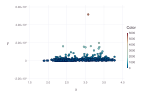

In [286]:
# Homoscedasticity assumption
plot(x=pred3_log, y=red3_log,color=fb_data[!, :like])

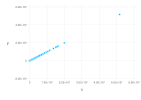

In [287]:
# Exogeneity assumption
plot(x = fb_data[!, :like], y=red2_log)

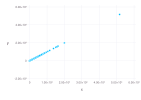

In [288]:
# Exogeneity assumption
plot(x = fb_data[!, :like], y=red3_log)